<a href="https://colab.research.google.com/github/nevita275/PCVK26_20_Triya/blob/main/Week3_20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## IDENTITAS MAHASISWA

In [1]:
# ===== SEL IDENTITAS - JANGAN DIHAPUS, HARUS SEL PERTAMA =====
import sys, platform, hashlib, datetime, zoneinfo

NAMA = 'Nevita Triya Yuliana'
NIM  = '244107020208'

N = int(NIM[-3:])
PARAM = {
   'b'    : (N % 61) + 20,
   'a'    : round(1.0 + (N % 9) / 10, 1),
   'c'    : (N % 20) + 30,
   'gamma': round(0.4 + (N % 6) * 0.25, 2),
   'bit'  : (N % 6) + 2,
}
waktu = datetime.datetime.now(zoneinfo.ZoneInfo('Asia/Jakarta'))

print('NAMA   :', NAMA)
print('NIM    :', NIM, '| N =', N)
for k, v in PARAM.items():
    print('%-6s :' % k, v)
print('WAKTU  :', waktu.strftime('%Y-%m-%d %H:%M:%S %Z'))
print('SISTEM :', sys.version.split()[0], platform.platform())
kunci = NIM + '|' + waktu.strftime('%Y-%m-%d')
print('TOKEN  :', hashlib.sha256(kunci.encode()).hexdigest()[:16])

NAMA   : Nevita Triya Yuliana
NIM    : 244107020208 | N = 208
b      : 45
a      : 1.1
c      : 38
gamma  : 1.4
bit    : 6
WAKTU  : 2026-09-18 19:35:42 WIB
SISTEM : 3.13.15 Linux-6.6.122+-x86_64-with-glibc2.39
TOKEN  : cae78066f5e39800


# PRAKTIKUM
**1. Mount Google Drive**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**2. Import Library & Setup Path**

In [3]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from math import log10, sqrt
import glob
import os

IMAGES_BASE = '/content/drive/MyDrive/PVCK/Images'
BASE = f'{IMAGES_BASE}/244107020208'

def safe_imread(path):
    if not os.path.exists(path):
        folder = os.path.dirname(path)
        isi = os.listdir(folder) if os.path.exists(folder) else 'folder tidak ada'
        raise FileNotFoundError(f"File tidak ditemukan: {path}\nIsi folder: {isi}")
    img = cv.imread(path)
    if img is None:
        raise ValueError(f"cv.imread gagal membaca file: {path}")
    return img

**3. Transformasi Linier Brightness**

 Mengubah tingkat kecerahan citra 
-----------------------------------
Masukkan nilai kecerahan: 30


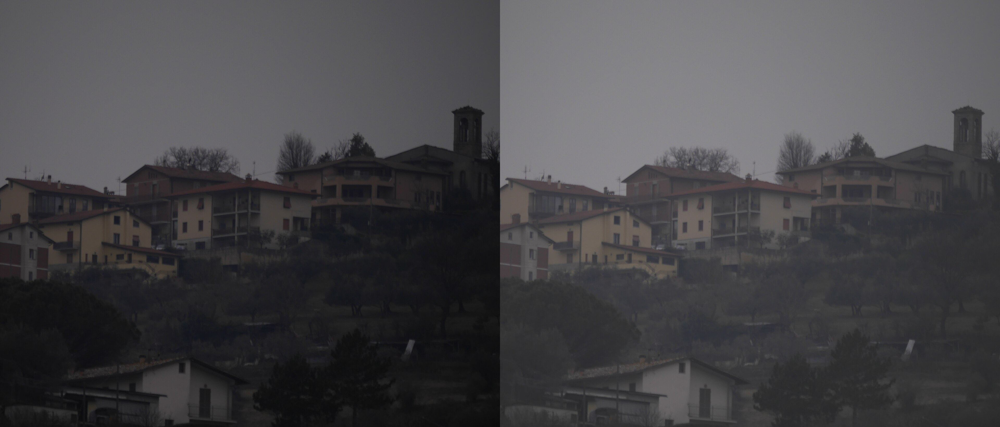

In [5]:
print(' Mengubah tingkat kecerahan citra ')
print('-----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread(f'{IMAGES_BASE}/houses.JPG')
brightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

# TUGAS PRAKTIKUM

**1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula pada bagian Ulasan Teori. Terapkan pada KTM1b.jpg dan KTM1a.jpg, tampilkan berdampingan dengan citra aslinya. Jelaskan mengapa citra negatif dari KTM1a (ruangan gelap) tampak pucat dan berkabut, sedangkan negatif dari KTM1b tetap
kontras.**

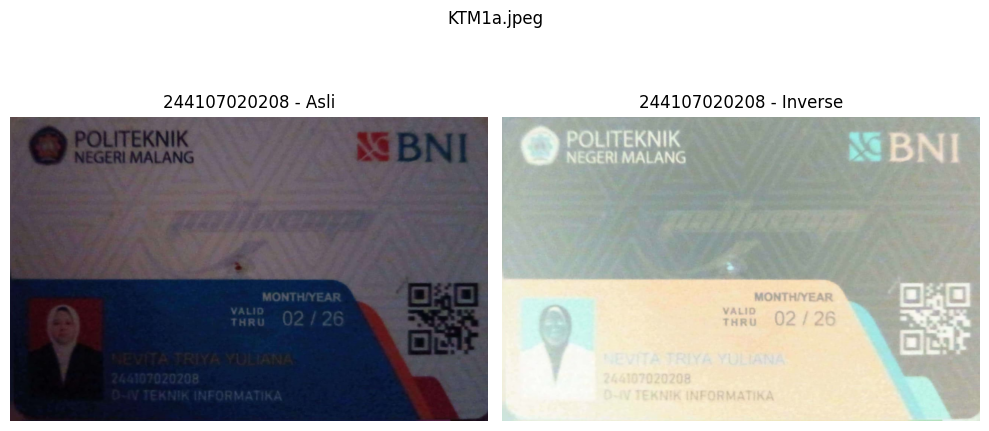

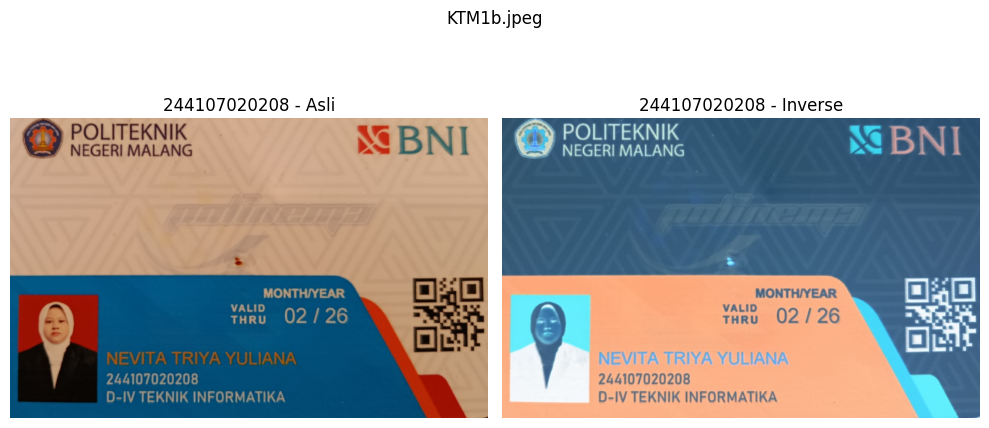

In [6]:
for nama_file in ['KTM1a.jpeg', 'KTM1b.jpeg']:
    original = safe_imread(f'{BASE}/{nama_file}')
    inverse = 255 - original

    fig, ax = plt.subplots(1, 2, figsize=(10,5))
    ax[0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB)); ax[0].set_title(NIM + ' - Asli'); ax[0].axis('off')
    ax[1].imshow(cv.cvtColor(inverse, cv.COLOR_BGR2RGB));  ax[1].set_title(NIM + ' - Inverse'); ax[1].axis('off')

    fig.suptitle(nama_file, y=0.95)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

Penjelasannya:
* KTM1a difoto di ruangan gelap punya pencahayaan yang kurang, sehingga hampir semua nilai piksel aslinya rendah (gelap) dan menumpuk rapat di satu area sempit pada histogram, tidak ada piksel yang benar-benar hitam pekat, dan tidak ada yang mendekati putih terang. Sedangkan
* KTM1b difoto dengan pencahayaan lampu ruangan yang lebih memadai, sehingga nilai pikselnya punya sebaran yang lebih lebar, ada bagian yang gelap, ada bagian yang terang, rentang dinamisnya luas. Saat di inverse, sebaran lebar ini tetap terjaga hanya posisi gelap dan terangnya yang tertukar. Karena sebarannya tetap lebar, perbedaan antar area masih jelas terlihat, sehingga hasilnya tetap kontras dan tajam.

**2. Implementasikan transformasi kontras dengan nilai a yang dihitung dari NIM Anda (PARAM['a']) pada KTM1a.jpg**

 Mengubah kontras dan tingkat kecerahan citra 
-----------------------------------
Masukkan kontras: 1.8
Masukkan tingkat kecerahan: 30


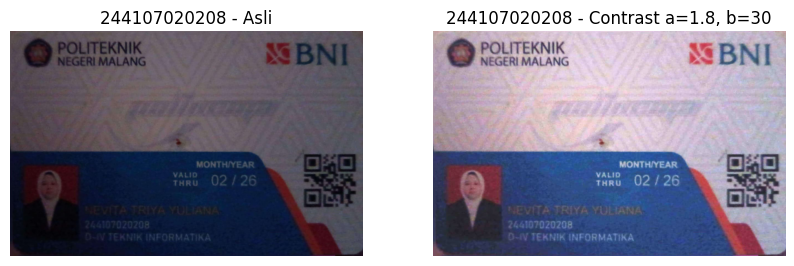

In [7]:
print(' Mengubah kontras dan tingkat kecerahan citra ')
print('-----------------------------------')
try:
    kontras_input = float(input('Masukkan kontras: ') or a)
    kecerahan_input = int(input('Masukkan tingkat kecerahan: ') or 0)
except ValueError:
    print('Error, not a number')
    kontras_input, kecerahan_input = a, 0

original = safe_imread(f'{BASE}/KTM1a.jpeg')
contrast_img = np.clip(original.astype(np.int16) * kontras_input + kecerahan_input, 0, 255).astype(np.uint8)

fig, ax = plt.subplots(1, 2, figsize=(10,5))
ax[0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB)); ax[0].set_title(NIM + ' - Asli'); ax[0].axis('off')
ax[1].imshow(cv.cvtColor(contrast_img, cv.COLOR_BGR2RGB)); ax[1].set_title(NIM + f' - Contrast a={kontras_input}, b={kecerahan_input}'); ax[1].axis('off')
plt.show()

Penjelasannya:

Dengan parameter dari NIM (a=1.1, b=0), perubahan kontras terlihat halus karena nilai a mendekati 1. Saat dicoba nilaia=1.8, b=30, citra menjadi pudar dan kehilangan detail karena banyak piksel melebihi 255 dan mengalami clipping. Semakin tinggi nilai a dan b, semakin besar risiko clipping, sehingga nilai kontras perlu disesuaikan agar detail penting pada citra tetap terbaca.

**3. Implementasikan transformasi logarithmic brightness dengan konstanta c hasil hitung dari NIM (PARAM['c']) pada KTM1a.jpg. Bandingkan hasilnya dengan linier brightness memakai nilai b hasil hitung dari NIM (PARAM['b']) pada citra yang sama. Tentukan metode mana yang membuat NIM pada kartu Anda lebih terbaca, dan tunjukkan bagian mana yang menjadi putih penuh (clipping) pada masing-masing metode.**

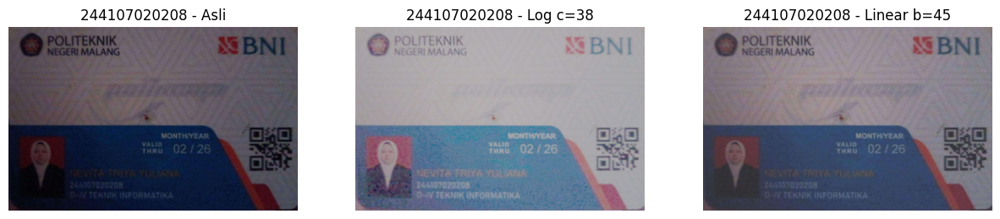

Persentase piksel yang clipping ke 255 (Log)   : 0.0 %
Persentase piksel yang clipping ke 255 (Linear): 0.0 %


In [10]:
c = PARAM['c']
b = PARAM['b']

original = safe_imread(f'{BASE}/KTM1a.jpeg')

# Transformasi log: s = c * log(1 + r)
log_img = c * np.log1p(original.astype(np.float64))
log_img = np.clip(log_img, 0, 255).astype(np.uint8)

# Transformasi linier brightness untuk perbandingan
linear_img = np.clip(original.astype(np.int16) + b, 0, 255).astype(np.uint8)

fig, ax = plt.subplots(1, 3, figsize=(15,5))
ax[0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB));   ax[0].set_title(NIM + ' - Asli'); ax[0].axis('off')
ax[1].imshow(cv.cvtColor(log_img, cv.COLOR_BGR2RGB));    ax[1].set_title(NIM + f' - Log c={c}'); ax[1].axis('off')
ax[2].imshow(cv.cvtColor(linear_img, cv.COLOR_BGR2RGB)); ax[2].set_title(NIM + f' - Linear b={b}'); ax[2].axis('off')
plt.show()

# Cek area yang jadi putih penuh (clipping) di masing-masing metode
print('Persentase piksel yang clipping ke 255 (Log)   :', np.mean(log_img == 255) * 100, '%')
print('Persentase piksel yang clipping ke 255 (Linear):', np.mean(linear_img == 255) * 100, '%')

Penjelasannya:

Dari hasil visual, metode Linear Brightness (b=45) justru membuat NIM pada kartu lebih terbaca dibanding Logarithmic Brightness (c=38). Meskipun secara teori transformasi log unggul untuk citra dengan pencahayaan sangat kurang, pada kasus KTM1a milik saya yang sudah cukup terang sejak awal, nilai c=38 menghasilkan penguatan berlebih yang membuat warna dan detail kartu menjadi pucat/desaturasi. Sebaliknya, Linear Brightness dengan b=45 memberikan penambahan kecerahan yang lebih moderat, sehingga kontras warna asli kartu tetap lebih terjaga.



**4. Implementasikan transformasi grayscale metode averaging, lightness, dan luminance pada KTM1c.jpg, yaitu citra yang diambil dengan flash. Hitung rata-rata dan simpangan baku intensitas hasil ketiga metode, sajikan dalam satu tabel, lalu tentukan metode mana yang memberi pemisahan paling jelas antara teks dan latar kartu.**

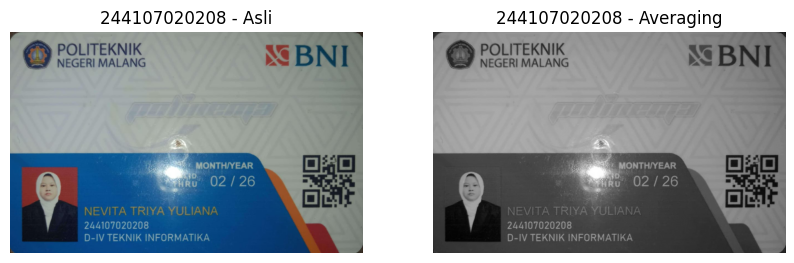

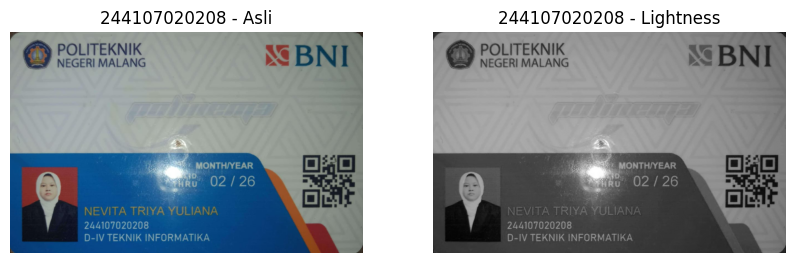

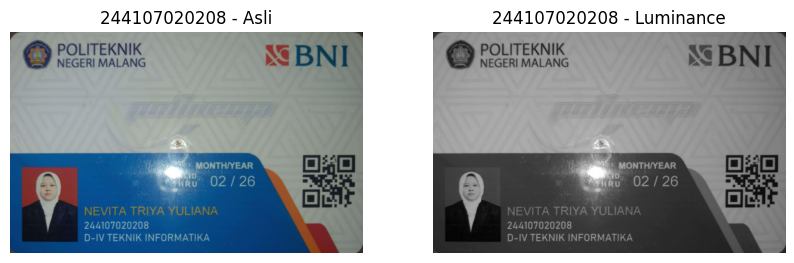

      Metode  Rata-rata Intensitas  Simpangan Baku
0  Averaging            121.381680       43.537683
1  Lightness            121.649935       43.371869
2  Luminance            118.916483       47.209990


In [11]:
def grayscale_avg(img):
    b, g, r = cv.split(img.astype(np.float64))
    return np.clip((r + g + b) / 3, 0, 255).astype(np.uint8)

def grayscale_lightness(img):
    b, g, r = cv.split(img.astype(np.float64))
    mx = np.maximum(np.maximum(r, g), b)
    mn = np.minimum(np.minimum(r, g), b)
    return np.clip((mx + mn) / 2, 0, 255).astype(np.uint8)

def grayscale_luminance(img):
    # Rec. 601 (sama seperti cv.cvtColor(img, cv.COLOR_BGR2GRAY))
    b, g, r = cv.split(img.astype(np.float64))
    return np.clip(0.299*r + 0.587*g + 0.114*b, 0, 255).astype(np.uint8)

original = safe_imread(f'{BASE}/KTM1c.jpeg')

g_avg  = grayscale_avg(original)
g_light = grayscale_lightness(original)
g_lum  = grayscale_luminance(original)

for nama, hasil in [('Averaging', g_avg), ('Lightness', g_light), ('Luminance', g_lum)]:
    fig, ax = plt.subplots(1, 2, figsize=(10,5))
    ax[0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB)); ax[0].set_title(NIM + ' - Asli'); ax[0].axis('off')
    ax[1].imshow(g_hasil if False else hasil, cmap='gray'); ax[1].set_title(NIM + f' - {nama}'); ax[1].axis('off')
    plt.show()

import pandas as pd
tabel = pd.DataFrame({
    'Metode': ['Averaging', 'Lightness', 'Luminance'],
    'Rata-rata Intensitas': [g_avg.mean(), g_light.mean(), g_lum.mean()],
    'Simpangan Baku': [g_avg.std(), g_light.std(), g_lum.std()],
})
print(tabel)

Penjelasannya:

Berdasarkan Rata-rata Intensitas simpangan baku, metode Luminance (std = 47,21) memberikan pemisahan paling jelas antara teks dan latar kartu dibandingkan Averaging (std = 43,54) dan Lightness (std = 43,37). Hal ini karena metode Luminance memberi pembobotan lebih besar pada kanal hijau (0,587) dibanding merah (0,299) dan biru (0,114), sesuai dengan sensitivitas mata manusia terhadap warna. Pembobotan ini menghasilkan sebaran intensitas yang lebih lebar, sehingga kontras antara area gelap dan area terang pada kartu menjadi lebih tegas dibanding kedua metode lainnya yang memperlakukan ketiga kanal warna secara lebih merata.

**5. Tampilkan satu warna tertentu pada citra dan ubah bagian lainnya menjadi grayscale. Gunakan OBJ1.jpg, yaitu foto benda milik Anda sendiri dengan satu warna dominan. Sebutkan rentang nilai HSV yang Anda pakai sebagai batas warna, lalu tunjukkan pengaruhnya apabila rentang tersebut diperlebar dan dipersempit.**

Rentang HSV dipakai: H[95-130] S[60-255] V[40-255]
Jumlah piksel tertangkap mask: 823770


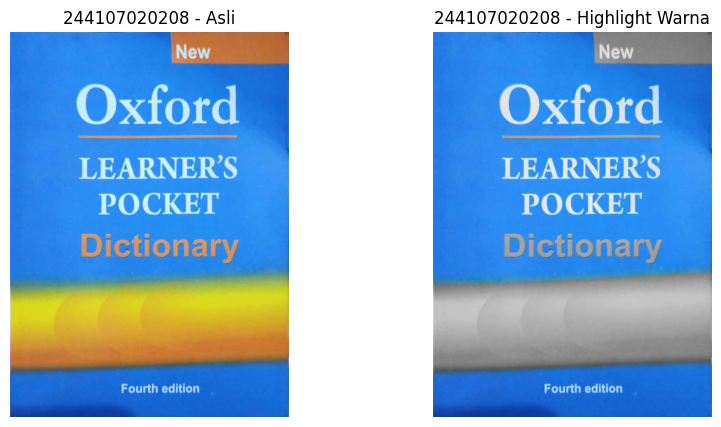

Piksel tertangkap (dipersempit): 772693
Piksel tertangkap (diperlebar): 864694


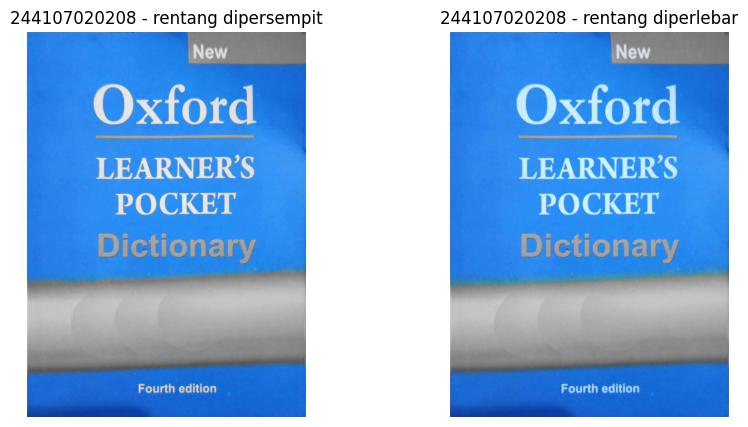

In [37]:
img = safe_imread(f'{BASE}/OBJ1.jpeg')
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

# 2. Rentang HSV utama untuk warna biru
lower = np.array([95, 60, 40])
upper = np.array([130, 255, 255])

mask = cv.inRange(hsv, lower, upper)
print('Rentang HSV dipakai: H[95-130] S[60-255] V[40-255]')
print('Jumlah piksel tertangkap mask:', np.sum(mask > 0))

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray_3ch = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)
result = np.where(mask[:, :, None].astype(bool), img, gray_3ch)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)); ax[0].set_title(NIM + ' - Asli'); ax[0].axis('off')
ax[1].imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB)); ax[1].set_title(NIM + ' - Highlight Warna'); ax[1].axis('off')
plt.show()

# 3. Uji pengaruh rentang dipersempit & diperlebar
ranges = {
    'dipersempit': (np.array([100, 170, 100]), np.array([125, 255, 255])),
    'diperlebar':  (np.array([85, 25, 20]),   np.array([135, 255, 255])),
}

results = {}
for label, (lo, hi) in ranges.items():
    m = cv.inRange(hsv, lo, hi)
    print(f'Piksel tertangkap ({label}):', np.sum(m > 0))
    results[label] = np.where(m[:, :, None].astype(bool), img, gray_3ch)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(cv.cvtColor(results['dipersempit'], cv.COLOR_BGR2RGB))
ax[0].set_title(NIM + ' - rentang dipersempit'); ax[0].axis('off')
ax[1].imshow(cv.cvtColor(results['diperlebar'], cv.COLOR_BGR2RGB))
ax[1].set_title(NIM + ' - rentang diperlebar'); ax[1].axis('off')
plt.show()

Penjelasannya:


* Rentang dipersempit H[100–125], S[170–255], V[100–255]:
Batas saturasi dan value dinaikkan sehingga hanya piksel biru yang paling jenuh dan paling terang yang lolos. Jumlah piksel tertangkap turun menjadi 772.693 (berkurang ±51.000). Piksel yang hilang terkonsentrasi di area pantulan cahaya (glossy highlight) pada permukaan sampul yang mengkilap, bagian ini saturasinya rendah karena memudar ke arah putih, sehingga gagal memenuhi ambang saturasi yang lebih ketat dan berubah menjadi grayscale.

* Rentang diperlebar H[85–135], S[25–255], V[20–255]:
Batas saturasi dan value diturunkan sehingga lebih banyak variasi biru (termasuk yang pudar dan gelap) ikut tertangkap. Jumlah piksel naik menjadi 864.694 (bertambah ±41.000). Piksel tambahan ini berasal dari area transisi/bayangan di sekitar lipatan halaman buku pada bagian bawah sampul, zona gradasi biru gelap menuju abu-abu yang sebelumnya tidak lolos ambang value pada rentang acuan, kini ikut tertangkap sebagai warna biru.

**6. Nilai gamma diminta dari pengguna melalui kode di bawah ini. Lanjutkan kode tersebut sesuai rumus pada Ulasan Teori, kemudian terapkan pada KTM1a.jpg. Mulailah dari nilai gamma hasil hitung dari NIM Anda, lalu cari secara bertahap nilai gamma yang membuat NIM dan nama pada kartu paling terbaca. Tampilkan minimal lima nilai gamma yang dicoba beserta hasilnya, sebutkan nilai gamma terbaik pilihan Anda, dan jelaskan mengapa nilai terbaik setiap mahasiswa berbeda meskipun jenis objeknya sama.**

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 1.4


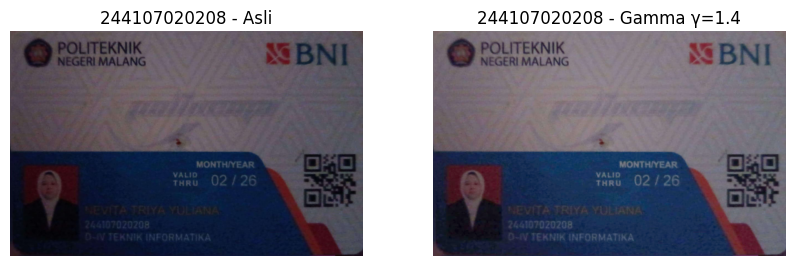

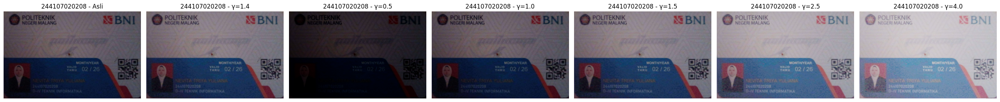

In [41]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')
    gamma = PARAM['gamma']

original = safe_imread(f'{BASE}/KTM1a.jpeg')
gamma_img = 255 * (original.astype(np.float64) / 255) ** (1 / gamma)
gamma_img = np.clip(gamma_img, 0, 255).astype(np.uint8)

fig, ax = plt.subplots(1, 2, figsize=(10,5))
ax[0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB)); ax[0].set_title(NIM + ' - Asli'); ax[0].axis('off')
ax[1].imshow(cv.cvtColor(gamma_img, cv.COLOR_BGR2RGB)); ax[1].set_title(NIM + f' - Gamma γ={gamma}'); ax[1].axis('off')
plt.show()

gamma_values = [PARAM['gamma'], 0.5, 1.0, 1.5, 2.5, 4.0]

fig, axes = plt.subplots(1, len(gamma_values) + 1, figsize=(4*(len(gamma_values)+1), 4))
axes[0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB)); axes[0].set_title(NIM + ' - Asli'); axes[0].axis('off')

for i, g in enumerate(gamma_values, start=1):
    gi = np.clip(255 * (original.astype(np.float64)/255) ** (1/g), 0, 255).astype(np.uint8)
    axes[i].imshow(cv.cvtColor(gi, cv.COLOR_BGR2RGB))
    axes[i].set_title(NIM + f' - γ={g}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Penjelasan:

Nilai gamma hasil nim saya adalah 1.4. Dari 6 nilai gamma yang diuji (γ=1.4, 0.5, 1.0, 1.5, 2.5, 4.0), nilai gamma terbaik adalah γ = 1.5, pada nilai ini tulisan NIM dan nama mahasiswa paling jelas terbaca, karena cukup mengangkat kecerahan area gelap tanpa membuat area terang jadi overexposed seperti pada γ=2.5 dan γ=4.0. Gamma terbaik bisa berbeda antar mahasiswa walau objeknya sejenis adalah karena nilai gamma optimal bergantung pada kondisi pencahayaan asli tiap foto (waktu, sumber cahaya, sudut, pantulan pada permukaan kartu yang glossy), bukan pada jenis objeknya. Foto yang lebih gelap dari awal butuh γ lebih besar untuk mencapai tingkat keterbacaan yang setara dengan foto yang sudah agak terang sejak awal, sehingga histogram intensitas piksel awal setiap foto menentukan γ optimalnya masing-masing.

**7. Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi citra, pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit). Pada pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga 255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0 (000 0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit. Jika 7bit, maka jumlah warnanya adalah 27 = 128, dst. Kuantisasi KTM1b.jpg pada kedalaman 1 sampai 7 bit dan tampilkan seluruh hasilnya.Tentukan pada kedalaman berapa nama dan NIM pada kartu Anda masih terbaca**

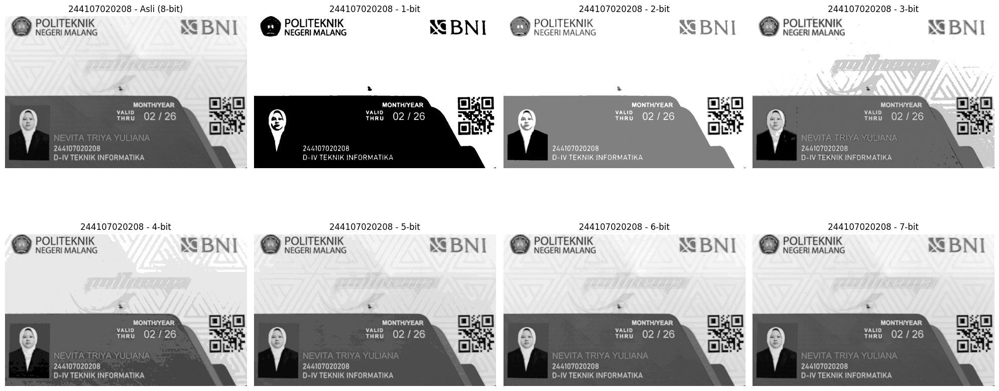

In [43]:
original_gray = safe_imread(f'{BASE}/KTM1b.jpeg')
if len(original_gray.shape) == 3:
    original_gray = cv.cvtColor(original_gray, cv.COLOR_BGR2GRAY)

fig, axes = plt.subplots(2, 4, figsize=(20,10))
axes = axes.ravel()
axes[0].imshow(original_gray, cmap='gray'); axes[0].set_title(NIM + ' - Asli (8-bit)'); axes[0].axis('off')

for i, bit_depth in enumerate(range(1, 8), start=1):
    level = 255 / (pow(2, bit_depth) - 1)
    depth_image = np.round(original_gray / level) * level
    depth_image = depth_image.astype(np.uint8)

    axes[i].imshow(depth_image, cmap='gray')
    axes[i].set_title(NIM + f' - {bit_depth}-bit')
    axes[i].axis('off')

plt.tight_layout()
plt.show()


Penjelasannya: Kedalaman minimum agar nama dan NIM masih terbaca adalah 2-bit, karena pada 1-bit informasi teks tersebut hilang total akibat kuantisasi yang terlalu kasar. Jadi yang terbaca jelas nama dan NIM adalah 3 bit sampai 8 bit (jumlahnya 7).

**8. Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab sebelumnya. Citra asli sudah disediakan pada /images/galaxy.jpg.
100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg
Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder , gunakan modul glob (import glob). Dengan menggunakan code diatas, anda tinggal memanggil image difolder tersebut menggunakan cv_img[0], cv_img[1], dst.Apakah peningkatan jumlah citra selalu memberikan peningkatan PSNR yang signifikan? Pada jumlah citra berapa peningkatan mulai tidak terlalu signifikan? Apa Kesimpulan yang Anda peroleh dari percobaan ini?**

/content/drive/MyDrive/PVCK/Images/noises -> ['2.jpg', '1.jpg', '11.jpg'] (101 file)
Jumlah citra noise ditemukan: 100


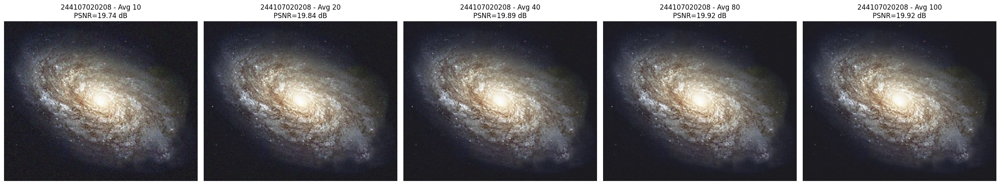

No  Jumlah Citra   Nilai PSNR (dB)     
1   10             19.74               
2   20             19.84               
3   40             19.89               
4   80             19.92               
5   100            19.92               


In [46]:
extract_dir = f'{IMAGES_BASE}/noises'

for root, dirs, files in os.walk(extract_dir):
    print(root, '->', files[:3], f'({len(files)} file)')

# FUNGSI PSNR
def PSNR(img1, img2):
    img1 = img1.astype(np.float64)
    img2 = img2.astype(np.float64)
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    return 20 * log10(255.0 / sqrt(mse))

galaxy_path = f'{IMAGES_BASE}/galaxy.jpg'
noises_glob = f'{extract_dir}/**/*.jpg'

original_galaxy = safe_imread(galaxy_path)

cv_img = []
for img_path in sorted(glob.glob(noises_glob, recursive=True)):
    n = cv.imread(img_path)
    if n is not None:
        cv_img.append(n)

print(f'Jumlah citra noise ditemukan: {len(cv_img)}')

# RATA-RATAKAN N CITRA & HITUNG PSNR
jumlah_list = [10, 20, 40, 80, 100]
hasil_psnr = []

fig, axes = plt.subplots(1, len(jumlah_list), figsize=(5*len(jumlah_list), 5))

for i, n in enumerate(jumlah_list):
    if n > len(cv_img):
        print(f'Peringatan: hanya ada {len(cv_img)} citra, tidak bisa ambil {n}. Dilewati.')
        continue

    stack = np.stack(cv_img[:n]).astype(np.float64)
    avg_image = np.mean(stack, axis=0).astype(np.uint8)
    psnr_value = PSNR(original_galaxy, avg_image)
    hasil_psnr.append((n, psnr_value))

    axes[i].imshow(cv.cvtColor(avg_image, cv.COLOR_BGR2RGB))
    axes[i].set_title(NIM + f' - Avg {n}\nPSNR={psnr_value:.2f} dB')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"{'No':<4}{'Jumlah Citra':<15}{'Nilai PSNR (dB)':<20}")
for i, (n, p) in enumerate(hasil_psnr, start=1):
    print(f"{i:<4}{n:<15}{p:<20.2f}")

Penjelasannya:

Semakin banyak citra yang diaverage, nilai PSNR semakin meningkat karena proses averaging mengurangi variansi noise Gaussian secara proporsional dengan 1/√n (n = jumlah citra). Namun, peningkatan ini tidak linear, pada tahap awal (10→20→40 citra) kenaikan PSNR cukup signifikan, sedangkan pada jumlah citra yang lebih besar (40→80→100) kenaikannya mulai melandai dan tidak lagi signifikan.
Hal ini terjadi karena hubungan antara jumlah citra dan pengurangan noise bersifat diminishing returns yaitu untuk mengurangi noise setengahnya saja, dibutuhkan 4x lipat jumlah citra (karena faktor 1/√n), sehingga menambah citra semakin banyak memberi manfaat semakin kecil. Titik signifikansi mulai melandai sekitar 40 citra di atas jumlah ini (80, 100 citra), kenaikan PSNR relatif kecil dibanding usaha/biaya komputasi tambahan untuk memproses lebih banyak citra.

**9. Buat mask biner Anda sendiri yang menutup area foto wajah dan area NIM pada
KTM1d.jpg, lalu gabungkan dengan citra menggunakan operator AND sehingga kedua
area tersebut tersamarkan. Tuliskan koordinat kotak mask yang Anda pakai. Lakukan percobaan menggunakan operator lain pada mask buatan Anda sendiri dan
tunjukkan hasilnya pada tabel berikut. Tuliskan analisa Anda mengapa citra keluarannya seperti itu.**

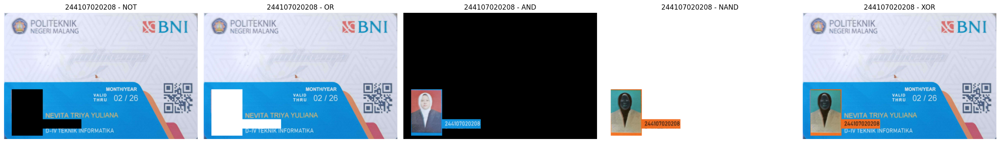

In [64]:
original = safe_imread(f'{BASE}/KTM1d.jpeg')
h, w = original.shape[:2]

mask = np.zeros((h, w), dtype=np.uint8)

cv.rectangle(mask, (60, 595), (300, 955), 255, -1)   # area wajah
cv.rectangle(mask, (110, 828), (600, 900), 255, -1)   # NIM

mask_3ch = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)
result_not  = cv.bitwise_not(mask_3ch)                                   # NOT pada mask dulu
result_not  = cv.bitwise_and(original, result_not)                       # lalu AND-kan ke citra asli

result_or   = cv.bitwise_or(original, mask_3ch)
result_and  = cv.bitwise_and(original, mask_3ch)
result_nand = cv.bitwise_not(cv.bitwise_and(original, mask_3ch))
result_xor  = cv.bitwise_xor(original, mask_3ch)

results = {
    'NOT': result_not,
    'OR': result_or,
    'AND': result_and,
    'NAND': result_nand,
    'XOR': result_xor
}

fig, axes = plt.subplots(1, 5, figsize=(25, 5))
for i, (nama_operator, img_hasil) in enumerate(results.items()):
    axes[i].imshow(cv.cvtColor(img_hasil, cv.COLOR_BGR2RGB))
    axes[i].set_title(NIM + f' - {nama_operator}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Penjelasannya:

Dari kelima operator, hanya AND yang cocok untuk tujuan menyamarkan data pribadi secara langsung menggunakan mask ini karena AND menonaktifkan (menghitamkan) area di luar mask. Namun untuk benar-benar menyembunyikan wajah & NIM (bukan menampilkannya), sebenarnya perlu mask yang dibalik (area wajah & NIM = 0, sisanya = 255), baru di AND kan itulah sebabnya hasil AND di atas justru menampilkan wajah & NIM, bukan menyembunyikannya. Operator lain (NOT, OR, NAND, XOR) masing-masing menunjukkan efek logika biner yang berbeda: OR & NAND cenderung "menghapus" detail dengan menimpa warna solid, sedangkan NOT & XOR menghasilkan efek invers warna pada area tertentu tergantung nilai mask.

**10. Carilah foto malam hari yang gelap. Namun, beberapa bagian gambar memiliki detail yang sebenarnya cukup baik. Pilih salah satu metode berikut dan implementasikan pada foto tersebut (Linear Brightness, Contrast, Logarithmic Brightness, Gamma Correction). Sebutkan alasan dan resiko metode yang Anda gunakan. Perbaiki kualitas pada citra tersebut dengan metode operasi dasar citra apapun. Diperbolehkan menggunakan lebih dari 1 metode. Kemudian jelaskan:**
* Metode yang dipilih
* Alasan pemilihan
* Menentukan parameter terbaik
* Menghasilkan citra dengan menunjukkan before-after.

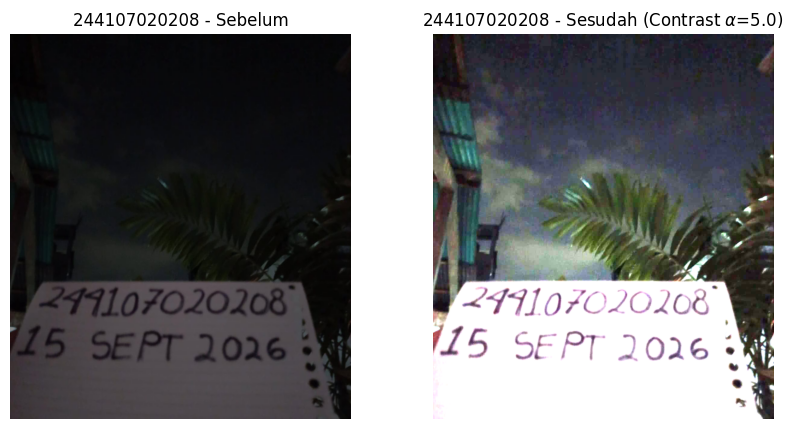

In [68]:
night_original = safe_imread(f'{BASE}/NIGHT1.jpeg')

# TODO: coba beberapa nilai alpha untuk menemukan yang terbaik
alpha_night = 5.0

# Menggunakan rumus Kontras
night_enhanced = np.clip(night_original.astype(np.float64) * alpha_night, 0, 255).astype(np.uint8)

fig, ax = plt.subplots(1, 2, figsize=(10,5))
ax[0].imshow(cv.cvtColor(night_original, cv.COLOR_BGR2RGB)); ax[0].set_title(NIM + ' - Sebelum'); ax[0].axis('off')
ax[1].imshow(cv.cvtColor(night_enhanced, cv.COLOR_BGR2RGB)); ax[1].set_title(NIM + f' - Sesudah (Contrast $\\alpha$={alpha_night})'); ax[1].axis('off')
plt.show()

Penjelasannya:

* Metode yang dipilih: Linear Contrast.
* Alasan pemilihan: Foto malam hari memiliki distribusi piksel yang menumpuk di nilai intensitas sangat rendah (gelap pekat). Metode kontras linear bekerja dengan mengalikan intensitas setiap piksel asli dengan sebuah konstanta(α). Hal ini bertujuan untuk merenggangkan rentang intensitas cahaya, sehingga objek yang tersembunyi di dalam kegelapan dapat dipaksa menjadi lebih terang dan kontras.
* Menentukan parameter terbaik: Pada percobaan ini, dipilih parameter α = 5.0. Angka pengali yang sangat besar ini dipilih karena tingkat kegelapan latar belakang foto sangat pekat. Dengan mengalikan piksel sebanyak 5 kali lipat, detail latar belakang yang sebelumnya tidak terlihat sama sekali (seperti daun-daun pohon dan struktur bangunan di belakang kertas) akhirnya bisa muncul dan dapat diamati secara visual.   
* Analisis Risiko & Efek Samping Visual: Penggunaan α = 5.0 pada citra ini secara sempurna mendemonstrasikan risiko utama dari metode Linear Contrast, yaitu:
  * Overexposure (Clipping): Objek kertas yang awalnya sudah memiliki sedikit pantulan cahaya ikut dikalikan 5. Akibatnya, nilai piksel pada kertas dengan cepat menabrak batas maksimal (255 atau putih murni). Hal ini menyebabkan kertas menjadi sangat silau (washed out).   
  * Amplifikasi Noise: noise yang biasa muncul pada kamera saat memotret di kondisi minim cahaya ikut terkalikan secara merata. Hal ini menyebabkan tekstur gambar hasil (terutama pada area langit dan daun) menjadi sangat kasar, berpasir, dan memunculkan bercak warna (seperti ungu/hijau) yang tidak natural.